#0.INTRODUCCIÓN

##0.1 Contexto

Hemos sido contratados por parte del gobierno Australiano, para determinar con base en información recogida a lo largo de todo el país si, dada unas variables al día siguiente lloverá. Las variables se presentan a continucación:

-Fecha: La fecha de observación.

-Ubicación: El nombre común de la ubicación de la estación meteorológica.

-MinTemp: La temperatura mínima en grados centígrados.

-MaxTemp: La temperatura máxima en grados centígrados.

-Precipitaciones: cantidad de lluvia registrada durante el día en mm.

-Evaporación: La denominada evaporación en recipiente Clase A (mm) en el horario de 24 horas hasta las 9 a.m.

-Sol: Número de horas de sol brillante en el día.

-WindGustDir: La dirección de la ráfaga de viento más fuerte en las 24 horas hasta la medianoche.

-WindGustSpeed: La velocidad (km/h) de la ráfaga de viento más fuerte en las 24 horas hasta la medianoche.

-WindDir9am: Dirección del viento a las 9am.

-WindDir3p: Dirección del viento a las 15:00 horas.

-WindSpeed9am: velocidad del viento (km/h) promediada durante 10 minutos antes de las 9 a.m.

-WindSpeed3pm: velocidad del viento (km/hr) promediada durante 10 minutos antes de las 3pm

-Humidity9a: Humedad (porcentaje) a las 9 a.m.

-Humedad3pm: Humedad (porcentaje) a las 3pm.

-Presión9 a. m.: La presión atmosférica (hpa) se redujo al nivel medio del mar a las 9 a. m.

-Presión 3:00 p. m.: La presión atmosférica (hpa) se redujo al nivel medio del mar a las 3:00 p. m.

-Nubosidad9am: Fracción del cielo oscurecida por las nubes a las 9am. Esto se mide en "oktas", que son una unidad de octavos. Registra cuántas octavas partes del cielo están oscurecidas por las nubes. Una medida 0 indica cielo completamente despejado mientras que un 8 indica que está completamente nublado.

-Nubosidad3pm: Fracción de cielo oscurecida por nubes (en "oktas": octavos) a las 15h. Consulte Cload9am para obtener una descripción de los valores.

-Temp9am: Temperatura (grados C) a las 9am.

-Temp3pm: Temperatura (grados C) a las 3pm.

-RainToday: Llovió Hoy.

-RainTomorrow. Loovió Mañana (Variable a predecir).


##0.2 Objetivo

Determinar si en el país de Australia lloverá mañana, a partir de los datos recogidos a lo largo del día.

##0.3 Contexto Comercial

Lo que se pretende con el objetivo anteriormente planteado es lograr la focalización de recursos por parte del gobierno con la idea principal de recolectar la mayor cantidad de agua posible, ya que el país cuenta con serios problemas de abastecimiento de agua, por ende, si logramos predecir con una precisión aprox del 80% si lloverá al día siguiente, el gobierno puede preparar en las diferentes zonas del país el equipo necesario para hacer la mayor cantidad de recolección de agua lluvia posible para mitigar las sequias.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
import statsmodels.api as sm
import scipy.stats as stats
from scipy.stats import shapiro

#1. Cargue de datos e identificación de los mismos

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/BrayanArismendi1997/BasesdedatosBrayan/main/weatherAUS.csv')
df.shape


(145460, 23)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

#1.1 Creación de umbral y tratamiento para nulos
Con esto se pretende descartar datos que tengan valores nulos o ceros pro debajo del límite y asi no tener en cuenta dichas variables

In [4]:
# Calcular el umbral del 80%
umbral = len(df) * 0.80

# Función para contar valores no nulos y no ceros
def contar_nulos(series):
    return series.notnull().sum() - (series == 0).sum()

# Identificar columnas que no cumplen con el umbral
columnas_eliminadas = [col for col in df.columns if contar_nulos(df[col]) < umbral]
columnas_ok = [col for col in df.columns if contar_nulos(df[col]) >= umbral]

# Eliminar las columnas que no cumplen con el umbral
df_cleaned = df.drop(columns=columnas_eliminadas)

# Imprimir columnas eliminadas y columnas restantes
print("Columnas eliminadas:", columnas_eliminadas)
print("Columnas restantes:", columnas_ok)
print(df_cleaned.shape)

Columnas eliminadas: ['Rainfall', 'Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm']
Columnas restantes: ['Date', 'Location', 'MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']
(145460, 18)


#4. Análisis Exploratorio de datos


In [5]:
df_cleaned.describe()

,MinTemp,MaxTemp,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,143693.000000,141851.00000
mean,12.194034,23.221348,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,16.990631,21.68339
std,6.398495,7.119049,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,6.488753,6.93665
min,-8.500000,-4.800000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,-7.200000,-5.40000
25%,7.600000,17.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,12.300000,16.60000
50%,12.000000,22.600000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,16.700000,21.10000
75%,16.900000,28.200000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,21.600000,26.40000
max,33.900000,48.100000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,40.200000,46.70000


In [6]:
df_cleaned['Date'] = pd.to_datetime(df_cleaned['Date'], errors='coerce')

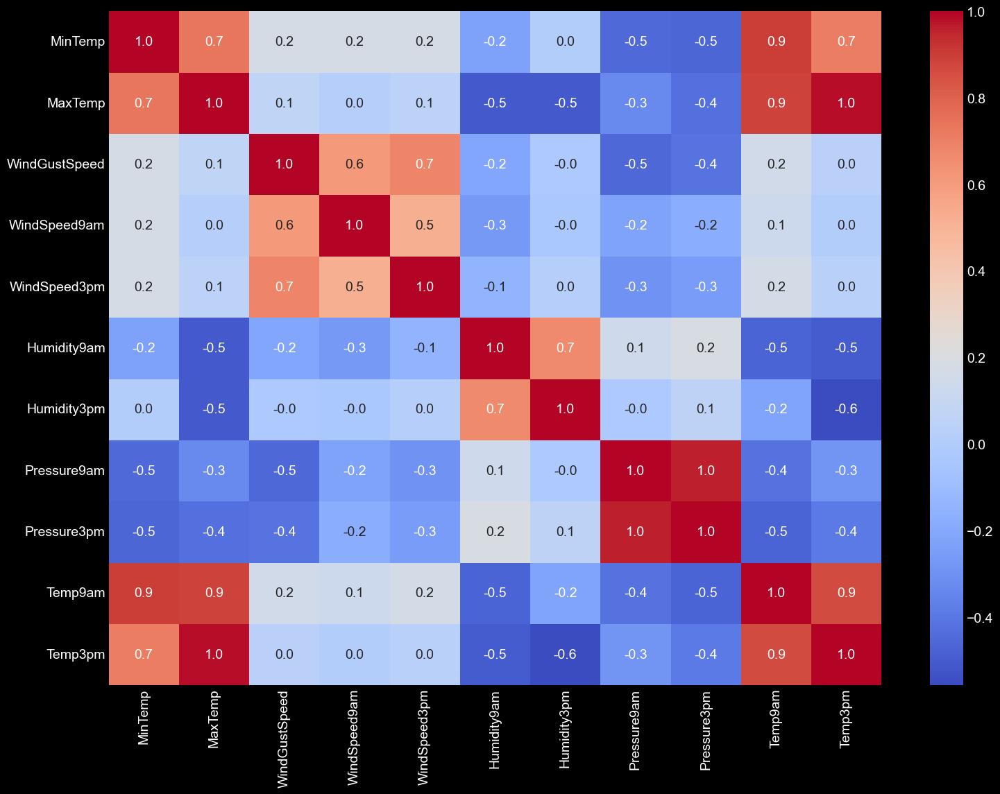

In [7]:
sns.set_style("darkgrid")
plt.style.use('dark_background')
# Eliminar columnas no numéricas
df_numeric = df_cleaned.select_dtypes(include=[float, int])

# Calcular la matriz de correlación
corr_matrix = df_numeric.corr()

# Crear una figura más grande
plt.figure(figsize=(16, 12))

# Generar el heatmap
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt='.1f')
plt.show()

Se identifican fuertes correlaciones en variables númericas tales como:
- Temp 9am vs Temp3pm.
- Temp 3pm vs MaxTemp
- MinTemp vs MaxTemp
- Humidity9am vs Humidity3pm
- Pressure9am vs Pressure3pm


Se procede a realziar una identificación gráfica de las variables para interpretar posible normalidad en algunas de ellas.

array([[<Axes: title={'center': 'MinTemp'}>,
        <Axes: title={'center': 'MaxTemp'}>,
        <Axes: title={'center': 'WindGustSpeed'}>],
       [<Axes: title={'center': 'WindSpeed9am'}>,
        <Axes: title={'center': 'WindSpeed3pm'}>,
        <Axes: title={'center': 'Humidity9am'}>],
       [<Axes: title={'center': 'Humidity3pm'}>,
        <Axes: title={'center': 'Pressure9am'}>,
        <Axes: title={'center': 'Pressure3pm'}>],
       [<Axes: title={'center': 'Temp9am'}>,
        <Axes: title={'center': 'Temp3pm'}>, <Axes: >]], dtype=object)

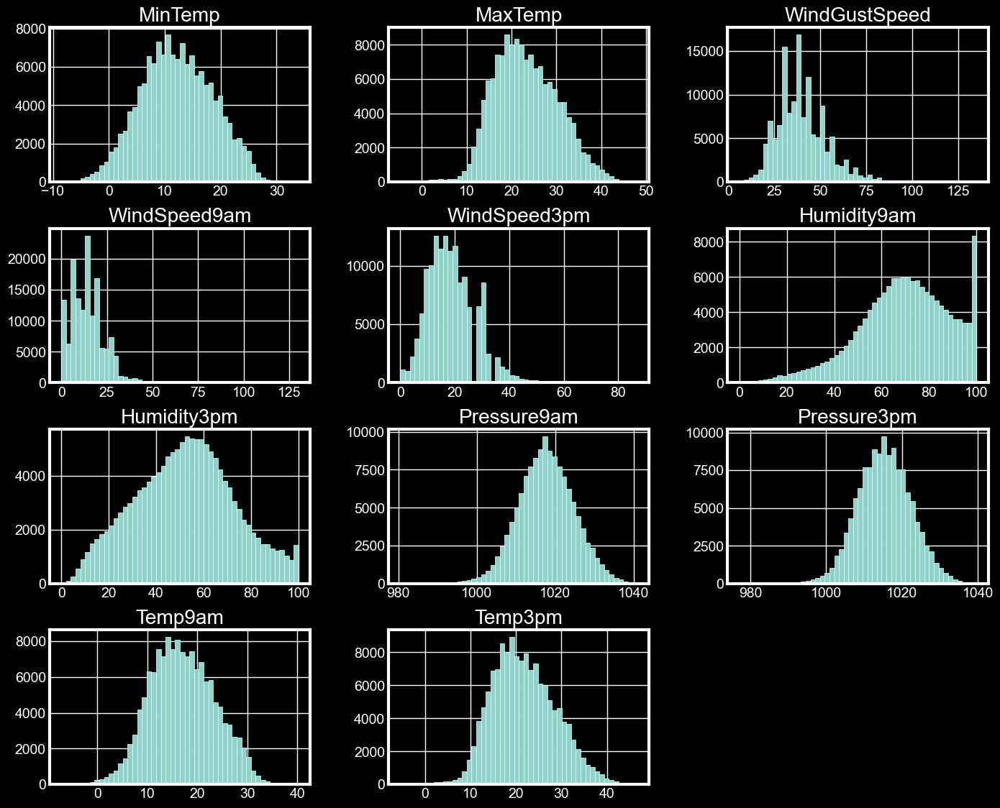

In [8]:
sns.set_style("darkgrid")
plt.style.use('dark_background')
df_numeric.hist(figsize=(15,13),bins=50)

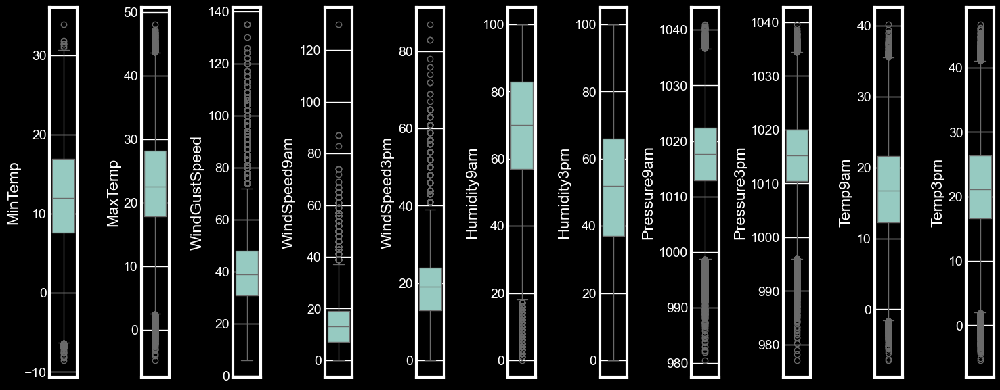

In [9]:
# Configurar el estilo oscuro
sns.set_style("darkgrid")
plt.style.use('dark_background')

# Obtener las columnas numéricas del DataFrame
variables = df_numeric.columns

# Crear una figura con subplots
fig, axes = plt.subplots(1, len(variables), figsize=(15, 6))

# Crear un diagrama de cajas para cada variable
for ax, variable in zip(axes, variables):
    sns.boxplot(y=variable, data=df_numeric, ax=ax)
    #ax.set_title(variable)
    ax.set_xlabel('')
# Ajustar las etiquetas en el eje x para que aparezcan en diagonal
plt.xticks(rotation=45)

# Ajustar el layout para evitar solapamientos
plt.tight_layout()

# Mostrar los diagramas de cajas
plt.show()

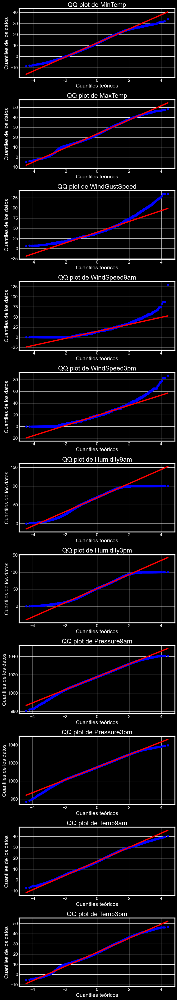

In [10]:
# Configurar el estilo oscuro
sns.set_style("darkgrid")
plt.style.use('dark_background')

# Obtener las columnas numéricas del DataFrame
variables = df_numeric.columns

# Crear una figura con subplots
fig, axes = plt.subplots(len(variables), 1, figsize=(8, len(variables) * 4))

# Crear un gráfico QQ para cada variable
for ax, variable in zip(axes, variables):
    # Crear el gráfico QQ
    stats.probplot(df_numeric[variable].dropna(), dist="norm", plot=ax)
    ax.get_lines()[1].set_color('r')  # Cambiar el color de la línea de referencia
    ax.set_title(f'QQ plot de {variable}')
    ax.set_xlabel('Cuantiles teóricos')
    ax.set_ylabel('Cuantiles de los datos')

# Ajustar el layout para evitar solapamientos
plt.tight_layout()

# Mostrar los gráficos QQ
plt.show()

Según el análisis gráfico hay serios indicios que algunas variables son normales, por tanto se realzia la siguiente construcción de hipotesis:

Ho1: Al menos 3 variables provienen de una distribución normal y su p-valor es por encima de 0,05.

Ha1: Ninguna de las variables proviene de una distribución normal y todos los p-valor estan por debajo de 0.05.

In [11]:
df_numeric.columns

Index(['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm',
       'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am',
       'Temp3pm'],
      dtype='object')

#Test de Shapiro-Wilk

In [12]:
# Iterar sobre cada columna numérica y realizar el test de Shapiro-Wilk
for column in df_numeric.columns:
    # Realizar el test de Shapiro-Wilk
    shapiro_test = shapiro(df_numeric[column].dropna())
    shapiro_pvalue = shapiro_test.pvalue

    # Determinar si los datos son normales o no normales
    if shapiro_pvalue < 0.05:
        normality = 'No normal'
    else:
        normality = 'Normal'

    # Imprimir el resultado
    print(f'Columna: {column}, p-valor: {shapiro_pvalue:.4f}, Distribución: {normality}')

Columna: MinTemp, p-valor: 0.0000, Distribución: No normal
Columna: MaxTemp, p-valor: 0.0000, Distribución: No normal
Columna: WindGustSpeed, p-valor: 0.0000, Distribución: No normal
Columna: WindSpeed9am, p-valor: 0.0000, Distribución: No normal
Columna: WindSpeed3pm, p-valor: 0.0000, Distribución: No normal
Columna: Humidity9am, p-valor: 0.0000, Distribución: No normal
Columna: Humidity3pm, p-valor: 0.0000, Distribución: No normal
Columna: Pressure9am, p-valor: 0.0000, Distribución: No normal
Columna: Pressure3pm, p-valor: 0.0000, Distribución: No normal
Columna: Temp9am, p-valor: 0.0000, Distribución: No normal
Columna: Temp3pm, p-valor: 0.0000, Distribución: No normal


c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 143975.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 144199.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 135197.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value m

Se valida la Ha1, por tanto ninguna variable proviene de una distribucón normal.

In [13]:
df_cleaned.head()

,Date,Location,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,No,No


In [14]:
# Reemplazar 'No' por 0 y 'Yes' por 1 en las columnas 'RainToday' y 'RainTomorrow'
df_cleaned['RainToday'] = df_cleaned['RainToday'].replace({'No': 0, 'Yes': 1})
df_cleaned['RainTomorrow'] = df_cleaned['RainTomorrow'].replace({'No': 0, 'Yes': 1})

C:\Users\BRAYAN ARISMENDI\AppData\Local\Temp\ipykernel_6380\2814920242.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cleaned['RainToday'] = df_cleaned['RainToday'].replace({'No': 0, 'Yes': 1})
C:\Users\BRAYAN ARISMENDI\AppData\Local\Temp\ipykernel_6380\2814920242.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cleaned['RainTomorrow'] = df_cleaned['RainTomorrow'].replace({'No': 0, 'Yes': 1})


In [15]:
df_cleaned.head()

,Date,Location,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,0.0,0.0
1,2008-12-02,Albury,7.4,25.1,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,0.0,0.0
2,2008-12-03,Albury,12.9,25.7,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,0.0,0.0
3,2008-12-04,Albury,9.2,28.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,0.0,0.0
4,2008-12-05,Albury,17.5,32.3,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,0.0,0.0


In [16]:
# Eliminar filas con valores nulos en las columnas específicas
df_cleaned = df_cleaned.dropna(subset=['RainToday', 'RainTomorrow'])

# Convertir las columnas a entero
df_cleaned['RainToday'] = df_cleaned['RainToday'].astype(int)
df_cleaned['RainTomorrow'] = df_cleaned['RainTomorrow'].astype(int)

In [17]:
df_cleaned.shape

(140787, 18)

In [18]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 18 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           140787 non-null  datetime64[ns]
 1   Location       140787 non-null  object        
 2   MinTemp        140319 non-null  float64       
 3   MaxTemp        140480 non-null  float64       
 4   WindGustDir    131624 non-null  object        
 5   WindGustSpeed  131682 non-null  float64       
 6   WindDir9am     131127 non-null  object        
 7   WindDir3pm     137117 non-null  object        
 8   WindSpeed9am   139732 non-null  float64       
 9   WindSpeed3pm   138256 non-null  float64       
 10  Humidity9am    139270 non-null  float64       
 11  Humidity3pm    137286 non-null  float64       
 12  Pressure9am    127044 non-null  float64       
 13  Pressure3pm    127018 non-null  float64       
 14  Temp9am        140131 non-null  float64       
 15  Temp3

Tratamiento para columnas con valores nulos

In [19]:
# 1. Eliminar las columnas WindDir9am, WindGustDir y WindDir3pm
df_cleaned = df_cleaned.drop(columns=['WindDir9am', 'WindDir3pm','WindGustDir'])

# 2. Identificar las columnas numéricas (float64) con menos valores no nulos que RainTomorrow
for column in df_cleaned.select_dtypes(include='float64').columns:
    if df_cleaned[column].notnull().sum() < len(df_cleaned):
        # Reemplazar valores faltantes con el promedio de la columna
        mean_value = df_cleaned[column].mean()
        df_cleaned[column].fillna(mean_value, inplace=True)

# Verificar el DataFrame para asegurarse de que los cambios se realizaron correctamente
print(df_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 15 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           140787 non-null  datetime64[ns]
 1   Location       140787 non-null  object        
 2   MinTemp        140787 non-null  float64       
 3   MaxTemp        140787 non-null  float64       
 4   WindGustSpeed  140787 non-null  float64       
 5   WindSpeed9am   140787 non-null  float64       
 6   WindSpeed3pm   140787 non-null  float64       
 7   Humidity9am    140787 non-null  float64       
 8   Humidity3pm    140787 non-null  float64       
 9   Pressure9am    140787 non-null  float64       
 10  Pressure3pm    140787 non-null  float64       
 11  Temp9am        140787 non-null  float64       
 12  Temp3pm        140787 non-null  float64       
 13  RainToday      140787 non-null  int32         
 14  RainTomorrow   140787 non-null  int32         
dtypes: da

C:\Users\BRAYAN ARISMENDI\AppData\Local\Temp\ipykernel_6380\247970028.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_cleaned[column].fillna(mean_value, inplace=True)


El tratamiento de data anterios, fue el preámbulo para la ejecución de un análisis de correlación dada una variable categorica y unas variables númericas, en este segmento se generan las siguiente hipotesis:

Ho2: Hay correlación entre la variable categorica y al menos 3 variables númericas.

Ha2: No hay correlación entre laa variable categorica y las variables númericas.

#Correlación Biserial

In [20]:
# Asegúrate de que 'RainTomorrow' sea de tipo entero (0 y 1)
df_cleaned['RainTomorrow'] = df_cleaned['RainTomorrow'].astype(int)

# Lista de columnas numéricas
variables_numericas = ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed9am',
                        'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                        'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

# Calcular el coeficiente biserial para cada variable numérica
for variable in variables_numericas:
    variable_numerica = df_cleaned[variable].dropna()  # Eliminar valores nulos si hay
    variable_categorica = df_cleaned['RainTomorrow'].dropna()

    # Asegurarse de que ambas series tienen la misma longitud
    if len(variable_numerica) == len(variable_categorica):
        coeficiente, p_valor = stats.pointbiserialr(variable_categorica, variable_numerica)

        # Determinar si hay correlación según el p-valor (umbral comúnmente 0.05)
        if p_valor < 0.05:
            correlacion = 'Hay correlación'
        else:
            correlacion = 'No hay correlación'

        # Imprimir resultados
        print(f'Variable: {variable}')
        print(f'Coeficiente de correlación de punto biserial: {coeficiente:.4f}')
        print(f'P-valor: {p_valor:.4f}')
        print(f'Correlación: {correlacion}')
        print('---')
    else:
        print(f'Variable {variable} tiene longitud diferente a la de RainTomorrow. Revisar datos.')

Variable: MinTemp
Coeficiente de correlación de punto biserial: 0.0842
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: MaxTemp
Coeficiente de correlación de punto biserial: -0.1593
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: WindGustSpeed
Coeficiente de correlación de punto biserial: 0.2256
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: WindSpeed9am
Coeficiente de correlación de punto biserial: 0.0895
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: WindSpeed3pm
Coeficiente de correlación de punto biserial: 0.0859
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: Humidity9am
Coeficiente de correlación de punto biserial: 0.2560
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: Humidity3pm
Coeficiente de correlación de punto biserial: 0.4415
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: Pressure9am
Coeficiente de correlación de punto biserial: -0.2359
P-valor: 0.0000
Correlación: Hay correlación
---
Variable: 

Se ha determinado la Ho2 con éxito, todas las variables tienen relación con la variable categorica, sin embargo algunas una relación muy debil.

Un p-valor bajo (por debajo de 0,05) indica que es muy poco probable que el coeficiente de correlación observado sea el resultado del azar, lo que sugiere que la correlación es estadísticamente significativa. Sin embargo, esto no garantiza que la correlación sea fuerte o relevante en términos prácticos.

Un p-valor menor a 0,05 con un coeficiente de correlación cercano a 0 puede suceder si tienes una muestra grande. En muestras grandes, incluso relaciones muy débiles pueden ser estadísticamente significativas debido a la gran cantidad de datos que permiten detectar diferencias pequeñas. Por tanto, se establecerá un parametro de correlación de 0,2 y calcularemos una correlación practica, en donde solo seleccionaremos las variables que tengan una correlación por encima de este valor para ser consideradas con influencia fuerte sobre la variable categorica.

In [21]:
# Asegúrate de que 'RainTomorrow' sea de tipo entero (0 y 1)
df_cleaned['RainTomorrow'] = df_cleaned['RainTomorrow'].astype(int)

# Lista de columnas numéricas
variables_numericas = ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed9am',
                        'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                        'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

# Definir el umbral de correlación para considerar práctica significativa
umbral_correlacion = 0.2  # Puedes ajustar este valor según tu criterio

# Lista para almacenar las columnas con correlación significativa
columnas_significativas = []

# Calcular el coeficiente biserial para cada variable numérica
for variable in variables_numericas:
    # Asegúrate de que 'RainTomorrow' y la variable numérica tengan la misma longitud
    df_temp = df_cleaned[['RainTomorrow', variable]].dropna()

    if len(df_temp) > 0:
        variable_numerica = df_temp[variable]
        variable_categorica = df_temp['RainTomorrow']

        # Calcular el coeficiente biserial y el p-valor
        coeficiente, p_valor = stats.pointbiserialr(variable_categorica, variable_numerica)

        # Determinar si hay correlación práctica significativa según el umbral
        if abs(coeficiente) >= umbral_correlacion:
            correlacion_practica = 'Correlación significativa'
            columnas_significativas.append({
                'Variable': variable,
                'Coeficiente de correlación de punto biserial': coeficiente,
                'P-valor': p_valor,
                'Correlación práctica': correlacion_practica
            })
        else:
            correlacion_practica = 'Correlación no significativa'
    else:
        correlacion_practica = 'No hay datos válidos'


# Imprimir todas las columnas que cumplen con la condición de correlación significativa
print("Columnas con correlación significativa:")
print('       ')
for resultado in columnas_significativas:
    print(f"Variable: {resultado['Variable']}")
    print(f"Coeficiente de correlación de punto biserial: {resultado['Coeficiente de correlación de punto biserial']:.4f}")
    print(f"P-valor: {resultado['P-valor']:.4f}")
    print(f"Correlación práctica: {resultado['Correlación práctica']}")
    print('---')






Columnas con correlación significativa:
       
Variable: WindGustSpeed
Coeficiente de correlación de punto biserial: 0.2256
P-valor: 0.0000
Correlación práctica: Correlación significativa
---
Variable: Humidity9am
Coeficiente de correlación de punto biserial: 0.2560
P-valor: 0.0000
Correlación práctica: Correlación significativa
---
Variable: Humidity3pm
Coeficiente de correlación de punto biserial: 0.4415
P-valor: 0.0000
Correlación práctica: Correlación significativa
---
Variable: Pressure9am
Coeficiente de correlación de punto biserial: -0.2359
P-valor: 0.0000
Correlación práctica: Correlación significativa
---
Variable: Pressure3pm
Coeficiente de correlación de punto biserial: -0.2168
P-valor: 0.0000
Correlación práctica: Correlación significativa
---


Esto nos premite determinar que seguiremos la construcción del modelo solamente con las variables númericas:

-WindGustSpeed

-Humidity9am

-Humidity3pm

-Pressure9am

-Pressure3pm


a continuación se plantea emplear el coeficiente de Spearman para determinar el nivel de correlación entre las dos variables categoricas RainTodat y RainTomorror. De ello se genera la siguiente hipotesis:



Ho3= no hay correlación entre las variables >0.05 se rechaza hipotesis nula

Ha3= si hay correlación entre las variables <0.05 se acepta

#Coeficiente de Spearman

In [22]:
# Calcular el coeficiente de Spearman
coeficiente, p_valor = stats.spearmanr(df_cleaned["RainTomorrow"], df_cleaned["RainToday"])

# Imprimir el coeficiente de Spearman y el p-valor
print("Coeficiente de Spearman:", coeficiente)
print("P-valor:", p_valor)

Coeficiente de Spearman: 0.3130967455089669
P-valor: 0.0


Se observa una correlación de las variables, por tanto la variable RainToday hará parte del modelo.

C:\Users\BRAYAN ARISMENDI\AppData\Local\Temp\ipykernel_6380\3072454636.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='RainTomorrow', data=df_cleaned, palette='plasma')


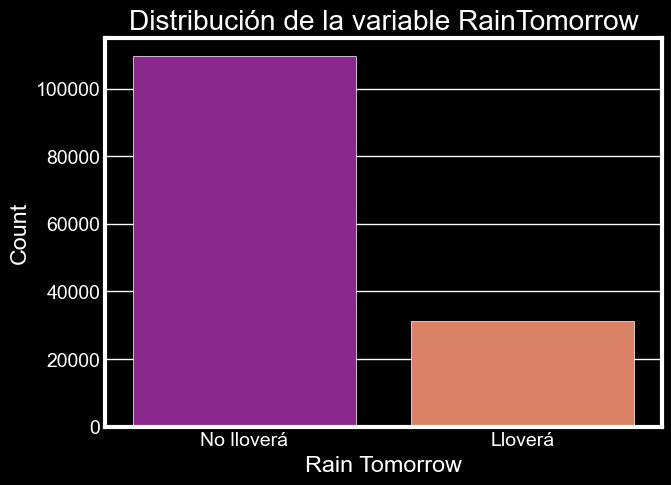

In [23]:
# Crear el gráfico de barras con Seaborn
sns.countplot(x='RainTomorrow', data=df_cleaned, palette='plasma')
plt.xticks(ticks=[0, 1], labels=['No lloverá', 'Lloverá'])
plt.xlabel('Rain Tomorrow')
plt.ylabel('Count')
plt.title('Distribución de la variable RainTomorrow')
plt.show()

El EDA nos ha permitido:

1. Encontrar qué variables númericas aportan significancia y harán parte del modelo.

2. Encontrar que variables categoricas aportan significacia y harán parte del modelo.

Para finalizar, se procede a realizar un contraste gráfico entre las variables númericas del dataset inicial y la variable a predecir RainTomorrow para complementar los análisis realziados anteriormente.


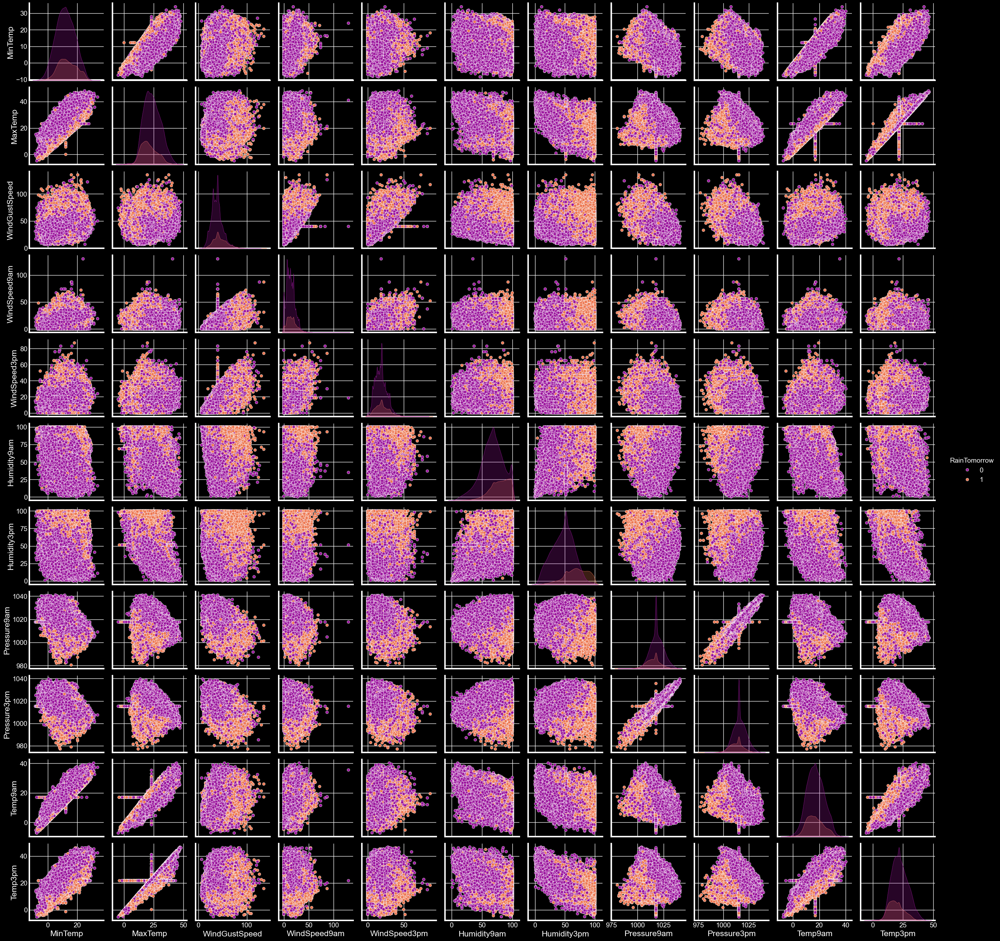

In [24]:
# Lista de columnas numéricas
variables_numericas = ['MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed9am',
                       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                       'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
# Crear el pairplot usando solo las variables numéricas y el hue como RainTomorrow
sns.pairplot(df_cleaned[variables_numericas + ['RainTomorrow']], hue='RainTomorrow', palette='plasma')
plt.show()

In [25]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 15 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           140787 non-null  datetime64[ns]
 1   Location       140787 non-null  object        
 2   MinTemp        140787 non-null  float64       
 3   MaxTemp        140787 non-null  float64       
 4   WindGustSpeed  140787 non-null  float64       
 5   WindSpeed9am   140787 non-null  float64       
 6   WindSpeed3pm   140787 non-null  float64       
 7   Humidity9am    140787 non-null  float64       
 8   Humidity3pm    140787 non-null  float64       
 9   Pressure9am    140787 non-null  float64       
 10  Pressure3pm    140787 non-null  float64       
 11  Temp9am        140787 non-null  float64       
 12  Temp3pm        140787 non-null  float64       
 13  RainToday      140787 non-null  int32         
 14  RainTomorrow   140787 non-null  int32         
dtypes: da

In [26]:
df_final = df_cleaned.drop(columns=['Date', 'Location','MinTemp','MaxTemp','WindSpeed9am','WindSpeed3pm','Temp9am','Temp3pm'])
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   WindGustSpeed  140787 non-null  float64
 1   Humidity9am    140787 non-null  float64
 2   Humidity3pm    140787 non-null  float64
 3   Pressure9am    140787 non-null  float64
 4   Pressure3pm    140787 non-null  float64
 5   RainToday      140787 non-null  int32  
 6   RainTomorrow   140787 non-null  int32  
dtypes: float64(5), int32(2)
memory usage: 7.5 MB


In [27]:
df_final.head()

,WindGustSpeed,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,RainToday,RainTomorrow
0,44.0,71.0,22.0,1007.7,1007.1,0,0
1,44.0,44.0,25.0,1010.6,1007.8,0,0
2,46.0,38.0,30.0,1007.6,1008.7,0,0
3,24.0,45.0,16.0,1017.6,1012.8,0,0
4,41.0,82.0,33.0,1010.8,1006.0,0,0


In [28]:
X = df_final.drop("RainTomorrow", axis=1) #Elimino de mi dataset la variable a predecir
y = df_final.RainTomorrow

In [29]:
round(y.value_counts(normalize=True)*100,1)

RainTomorrow
0    77.8
1    22.2
Name: proportion, dtype: float64

In [67]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
import xgboost as xgb 
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingClassifier as GBC
gbrt = GBC()
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import precision_score, accuracy_score
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten,Dense
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier

ModuleNotFoundError: No module named 'keras.wrappers'

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=123)

Decision Tree Classifier

In [32]:
clf_tree = DecisionTreeClassifier()
param_grid = {
    'max_depth': [5, 10, 15,20,25,30,35,100,200,500],  # Profundidad máxima
    'min_samples_split': [10, 20, 30,40,50,100],  # Número mínimo de muestras requeridas para dividir un nodo interno
    'min_samples_leaf': [5,9],  # Número mínimo de muestras requeridas en cada hoja del árbol
    'ccp_alpha':[0,0.5,1,10,100]
}

clf_tree_cv = HalvingGridSearchCV(clf_tree, param_grid=param_grid, cv=3, min_resources=100, scoring='accuracy', n_jobs=-1, verbose=2)

clf_tree_cv.fit(X_train, y_train)
y_train_pred = clf_tree_cv.predict(X_train) #Prediccion en Train
y_test_pred = clf_tree_cv.predict(X_test) #Prediccion en Test


n_iterations: 6
n_required_iterations: 6
n_possible_iterations: 7
min_resources_: 100
max_resources_: 98550
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 600
n_resources: 100
Fitting 3 folds for each of 600 candidates, totalling 1800 fits
----------
iter: 1
n_candidates: 200
n_resources: 300
Fitting 3 folds for each of 200 candidates, totalling 600 fits
----------
iter: 2
n_candidates: 67
n_resources: 900
Fitting 3 folds for each of 67 candidates, totalling 201 fits
----------
iter: 3
n_candidates: 23
n_resources: 2700
Fitting 3 folds for each of 23 candidates, totalling 69 fits
----------
iter: 4
n_candidates: 8
n_resources: 8100
Fitting 3 folds for each of 8 candidates, totalling 24 fits
----------
iter: 5
n_candidates: 3
n_resources: 24300
Fitting 3 folds for each of 3 candidates, totalling 9 fits


c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


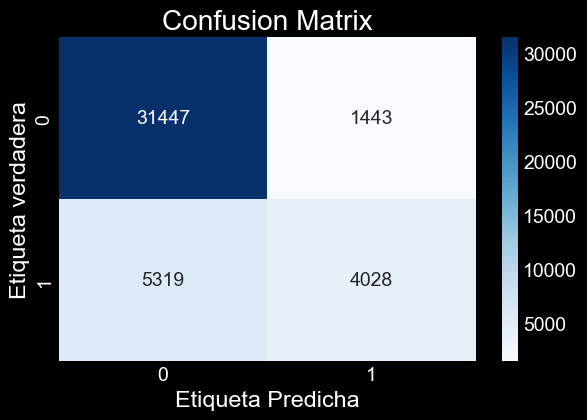

In [33]:
cm1 = confusion_matrix(y_test, y_test_pred)
# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm1, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta verdadera")
plt.show()
#Clase 1: Llovió
#Clase 0: No llovió

In [34]:
acc_nb = accuracy_score(y_test, y_test_pred)
prec_nb = precision_score(y_test,y_test_pred)
print('Precision del modelo: ', prec_nb)
print('Accuracy del modelo: ', acc_nb)

Precision del modelo:  0.7362456589288978
Accuracy del modelo:  0.839903402230272


Random Forest Classifier

In [35]:
#Creamos nuestro objeto RF
clf =  RandomForestClassifier()
param_grid = {'n_estimators': [200,300,400,500,600],  # Número de árboles en el bosque
    'max_depth': [18, 20,22,24,26],  # Profundidad máxima de cada árbol
    'min_samples_split': [5, 15,20,25],  # Número mínimo de muestras requeridas para dividir un nodo interno
    'min_samples_leaf': [4, 6,8,10]  # Número mínimo de muestras requeridas en cada hoja del árbol
    #'bootstrap': [True, False]  # Indica si se debe realizar bootstrap para construir los árboles
}
#Aplicamos la grilla al modelo
#Utilizamos la grilla definida anteriormente...
RF_halving_cv = HalvingGridSearchCV(clf, param_grid=param_grid, factor=3, min_resources=40, cv=5,  scoring='f1', n_jobs=-1, verbose=2)
clf.fit(X_train, y_train)
y_train_pred = clf.predict(X_train) #Prediccion en Train
y_test_pred = clf.predict(X_test)

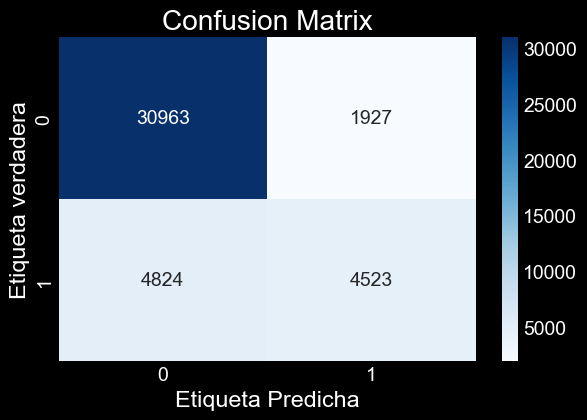

In [36]:
cm2 = confusion_matrix(y_test, y_test_pred)
# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm2, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta verdadera")
plt.show()
#Clase 1: Llovió
#Clase 0: No llovió

In [37]:
acc_nb = accuracy_score(y_test, y_test_pred)
prec_nb = precision_score(y_test,y_test_pred)
print('Precision del modelo: ', prec_nb)
print('Accuracy del modelo: ', acc_nb)

Precision del modelo:  0.7012403100775194
Accuracy del modelo:  0.8401638373937543


Extra Tree Classifier

In [38]:
#Creamos nuestro objeto ET
clfET = ExtraTreesClassifier()
param_grid = {
    'n_estimators': [200, 300, 400, 500, 600],  # Número de árboles en el bosque
    'max_depth': [18, 20, 22, 24, 26],  # Profundidad máxima de cada árbol
    'min_samples_split': [5, 15, 20, 25],  # Número mínimo de muestras requeridas para dividir un nodo interno
    'min_samples_leaf': [4, 6, 8, 10]  # Número mínimo de muestras requeridas en cada hoja del árbol
    # 'bootstrap': [True, False]  # Indica si se debe realizar bootstrap para construir los árboles
}

ET_halving_cv = HalvingGridSearchCV(clfET, param_grid=param_grid, factor=3, min_resources=40, cv=5, scoring='f1', n_jobs=-1, verbose=2)
clfET.fit(X_train, y_train)
y_train_pred = clfET.predict(X_train)  # Predicción en Train
y_test_pred = clfET.predict(X_test)

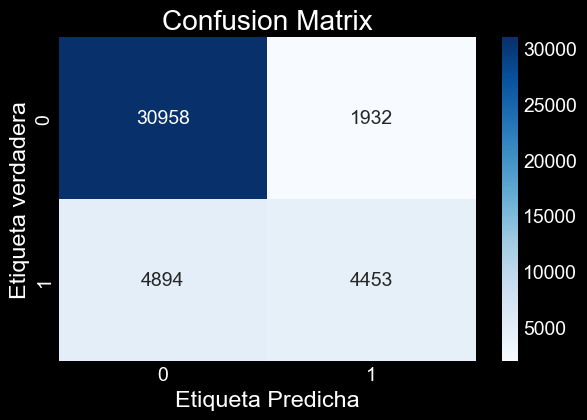

In [39]:
cm3 = confusion_matrix(y_test, y_test_pred)
# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm3, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta verdadera")
plt.show()
#Clase 1: Llovió
#Clase 0: No llovió

In [40]:
acc_nb = accuracy_score(y_test, y_test_pred)
prec_nb = precision_score(y_test,y_test_pred)
print('Precision del modelo: ', prec_nb)
print('Accuracy del modelo: ', acc_nb)

Precision del modelo:  0.6974158183241973
Accuracy del modelo:  0.8383881430972844


Xgboost - Clasificación

In [41]:
clf_xgb = xgb.XGBClassifier()
param_grid = {'n_estimators': np.arange(100,500,100),  # Número de árboles en el bosque
    'max_depth': [5, 10, 15,20,25,50],  # Profundidad máxima de cada árbol
    'min_samples_split': [10, 20, 30],  # Número mínimo de muestras requeridas para dividir un nodo interno
    'min_samples_leaf': [5,9],  # Número mínimo de muestras requeridas en cada hoja del árbol
    'gamma':[i/10.0 for i in range(1,8,2)],
    'alpha':np.arange(0.1,0.8,0.2)
}
clf_xgb_cv = HalvingGridSearchCV(clf_xgb, param_grid=param_grid, cv=5, min_resources=100, scoring='accuracy', n_jobs=-1, verbose=2)
clf_xgb_cv.fit(X_train, y_train)
y_train_pred = clf_xgb_cv.predict(X_train) #Prediccion en Train
y_test_pred = clf_xgb_cv.predict(X_test)

n_iterations: 7
n_required_iterations: 8
n_possible_iterations: 7
min_resources_: 100
max_resources_: 98550
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 2304
n_resources: 100
Fitting 5 folds for each of 2304 candidates, totalling 11520 fits
----------
iter: 1
n_candidates: 768
n_resources: 300
Fitting 5 folds for each of 768 candidates, totalling 3840 fits
----------
iter: 2
n_candidates: 256
n_resources: 900
Fitting 5 folds for each of 256 candidates, totalling 1280 fits
----------
iter: 3
n_candidates: 86
n_resources: 2700
Fitting 5 folds for each of 86 candidates, totalling 430 fits
----------
iter: 4
n_candidates: 29
n_resources: 8100
Fitting 5 folds for each of 29 candidates, totalling 145 fits
----------
iter: 5
n_candidates: 10
n_resources: 24300
Fitting 5 folds for each of 10 candidates, totalling 50 fits
----------
iter: 6
n_candidates: 4
n_resources: 72900
Fitting 5 folds for each of 4 candidates, totalling 20 fits


c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:49:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


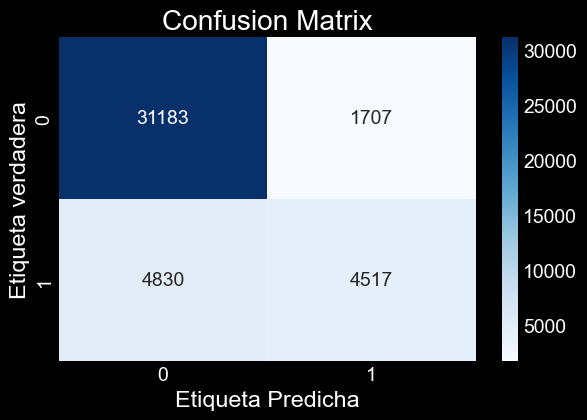

In [42]:
cm4 = confusion_matrix(y_test, y_test_pred)
# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm4, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta verdadera")
plt.show()
#Clase 1: Llovió
#Clase 0: No llovió

In [43]:
acc_nb = accuracy_score(y_test, y_test_pred)
prec_nb = precision_score(y_test,y_test_pred)
print('Precision del modelo: ', prec_nb)
print('Accuracy del modelo: ', acc_nb)

Precision del modelo:  0.7257390745501285
Accuracy del modelo:  0.8452304851196818


LightGBM- Clasificación

In [44]:
clf_LightGBM  = lgb.LGBMClassifier()
param_grid = {'n_estimators': np.arange(100,1000,100),  # Número de árboles en el bosque
    #'max_depth': [5, 10, 15],  # Profundidad máxima de cada árbol
    #'min_samples_split': [10, 20, 30],  # Número mínimo de muestras requeridas para dividir un nodo interno
    #'min_samples_leaf': [5,9],  # Número mínimo de muestras requeridas en cada hoja del árbol
    'lambda':[i/10.0 for i in range(1,8,2)],
    'alpha':np.arange(0.1,0.8,0.2)
}
clf_LightGBM_cv = HalvingGridSearchCV(clf_LightGBM, param_grid=param_grid, cv=5, min_resources=100, scoring='accuracy', n_jobs=-1, verbose=2)
clf_LightGBM_cv.fit(X_train, y_train)
y_train_pred = clf_LightGBM_cv.predict(X_train) #Prediccion en Train
y_test_pred = clf_LightGBM_cv.predict(X_test) 

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 7
min_resources_: 100
max_resources_: 98550
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 144
n_resources: 100
Fitting 5 folds for each of 144 candidates, totalling 720 fits
----------
iter: 1
n_candidates: 48
n_resources: 300
Fitting 5 folds for each of 48 candidates, totalling 240 fits


c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


----------
iter: 2
n_candidates: 16
n_resources: 900
Fitting 5 folds for each of 16 candidates, totalling 80 fits


c:\Users\BRAYAN ARISMENDI\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


----------
iter: 3
n_candidates: 6
n_resources: 2700
Fitting 5 folds for each of 6 candidates, totalling 30 fits
----------
iter: 4
n_candidates: 2
n_resources: 8100
Fitting 5 folds for each of 2 candidates, totalling 10 fits
[LightGBM] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=0.7. Current value: lambda_l2=0.7
[LightGBM] [Warning] lambda_l2 is set with reg_lambda=0.0, will be overridden by lambda=0.7. Current value: lambda_l2=0.7
[LightGBM] [Info] Number of positive: 21854, number of negative: 76696
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 780
[LightGBM] [Info] Number of data points in the train set: 98550, number of used features: 6
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.221755 -> initscore=-1.255466
[LightGBM] [Info] Start trai

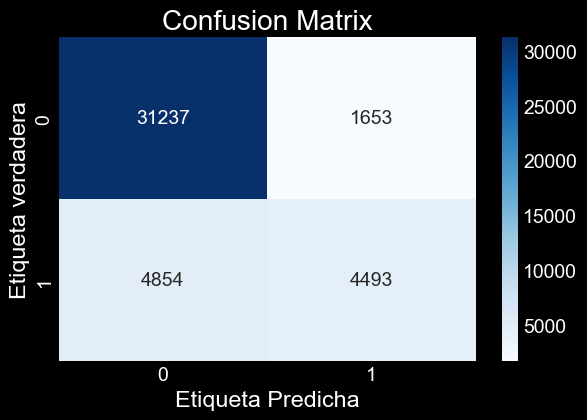

In [45]:
cm5 = confusion_matrix(y_test, y_test_pred)
# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm5, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta verdadera")
plt.show()
#Clase 1: Llovió
#Clase 0: No llovió

In [46]:
acc_nb = accuracy_score(y_test, y_test_pred)
prec_nb = precision_score(y_test,y_test_pred)
print('Precision del modelo: ', prec_nb)
print('Accuracy del modelo: ', acc_nb)

Precision del modelo:  0.7310445818418484
Accuracy del modelo:  0.8459407628382698


Red neuronal de tipo perceptrón multicapa (MLP)

In [47]:
# Creamos nuestro objeto MLPClassifier
clfMLP = MLPClassifier()
param_grid = {
    'hidden_layer_sizes': [(500,), (250, 250), (150, 100, 50), (100, 50, 25)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'learning_rate': ['constant', 'adaptive'],
    'solver': ['adam', 'sgd']  # Agregar diferentes optimizadores
}

# Aplicamos la grilla al modelo
MLP_halving_cv = HalvingGridSearchCV(clfMLP, param_grid=param_grid, cv=5, min_resources=100, scoring='accuracy', n_jobs=-1, verbose=2)
MLP_halving_cv.fit(X_train, y_train)
y_train_pred = MLP_halving_cv.predict(X_train)  # Predicción en Train
y_test_pred = MLP_halving_cv.predict(X_test)


n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 7
min_resources_: 100
max_resources_: 98550
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 192
n_resources: 100
Fitting 5 folds for each of 192 candidates, totalling 960 fits
----------
iter: 1
n_candidates: 64
n_resources: 300
Fitting 5 folds for each of 64 candidates, totalling 320 fits
----------
iter: 2
n_candidates: 22
n_resources: 900
Fitting 5 folds for each of 22 candidates, totalling 110 fits
----------
iter: 3
n_candidates: 8
n_resources: 2700
Fitting 5 folds for each of 8 candidates, totalling 40 fits
----------
iter: 4
n_candidates: 3
n_resources: 8100
Fitting 5 folds for each of 3 candidates, totalling 15 fits


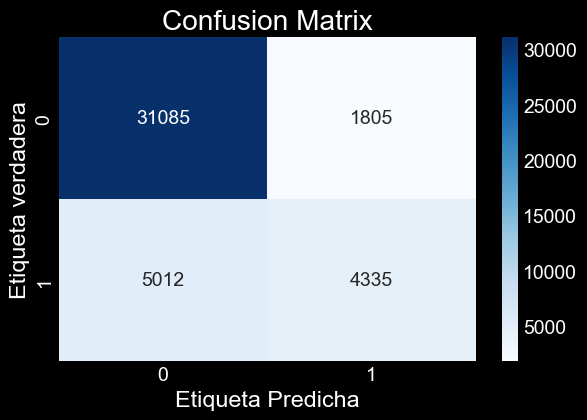

In [48]:
cm6 = confusion_matrix(y_test, y_test_pred)
# usando heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm6, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta verdadera")
plt.show()
#Clase 1: Llovió
#Clase 0: No llovió

In [49]:
acc_nb = accuracy_score(y_test, y_test_pred)
prec_nb = precision_score(y_test,y_test_pred)
print('Precision del modelo: ', prec_nb)
print('Accuracy del modelo: ', acc_nb)

Precision del modelo:  0.7060260586319218
Accuracy del modelo:  0.8386012264128607


Red neuronal convolucional (CNN)

In [ ]:
X_train = X_train.values.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.values.reshape(X_test.shape[0], X_test.shape[1], 1)

In [87]:
# Crear un modelo secuencial (CNN)
model = Sequential()
model.add(Conv1D(120, kernel_size=3, activation='relu', input_shape=(6, 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Clasificación binaria

# Compilar el modelo
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Entrenar el modelo con tus datos de clasificación
model.fit(X_train, y_train, epochs=13, batch_size=32)

# Predicciones en el conjunto de prueba
y_test_pred_probs = model.predict(X_test)
y_test_pred = (y_test_pred_probs > 0.5).astype(int)


Epoch 1/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8287 - loss: 0.3907
Epoch 2/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8420 - loss: 0.3695
Epoch 3/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8414 - loss: 0.3675
Epoch 4/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8403 - loss: 0.3715
Epoch 5/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8416 - loss: 0.3682
Epoch 6/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8424 - loss: 0.3648
Epoch 7/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8429 - loss: 0.3641
Epoch 8/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8424 - loss: 0.3642
Epoch 9/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8428 - loss: 0.3644
Epoch 10/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8440 - loss: 0.3624
Epoch 11/13
3080/3080 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8444 - loss: 0.3594
Epoch 12/13
3080/3080 ━━━━━━━━

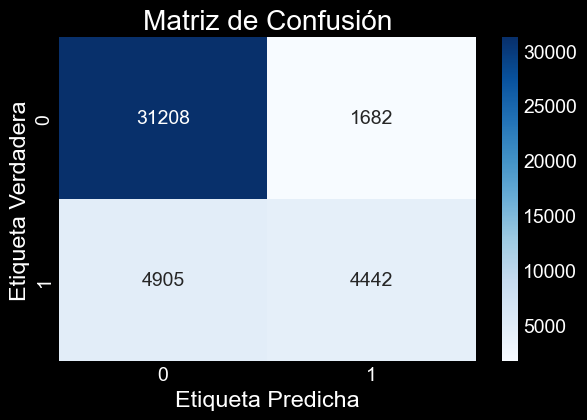

In [88]:
cm = confusion_matrix(y_test, y_test_pred)

# Visualizar la matriz de confusión
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusión")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta Verdadera")
plt.show()

In [89]:
# Calcular la precisión y la exactitud
acc = accuracy_score(y_test, y_test_pred)
prec = precision_score(y_test, y_test_pred)
print('Precisión del modelo: ', prec)
print('Exactitud del modelo: ', acc)

Precisión del modelo:  0.725342913128674
Exactitud del modelo:  0.8440466889220352


Por lo anterior el mejor modelo para abordar el problema de predicción del clima es LightGBM, con unas métricas de rendimiento de:

Precision del modelo:  0.7310445818418484


Accuracy del modelo:  0.8459407628382698
